In [1]:
#  Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

#  world maps
# import folium

import folium
from folium.plugins import MarkerCluster
import plotly.express as px  #  ploty express

# Kaggle directories
import os
print(os.listdir("../input"))
from subprocess import check_output
print(os.listdir("../input"))
# print(check_output(["ls", "../input"]).decode("utf8"))

['.ipynb_checkpoints', 'concap.csv', 'corporate_stress_dataset.csv', 'file.csv', 'input.ipynb', 'master.csv', 'project.ipynb', 'Suicides_in_India.csv', 'Untitled Folder', 'world-countries.json']
['.ipynb_checkpoints', 'concap.csv', 'corporate_stress_dataset.csv', 'file.csv', 'input.ipynb', 'master.csv', 'project.ipynb', 'Suicides_in_India.csv', 'Untitled Folder', 'world-countries.json']


# 1. Data Preparation 
# 1.1 Data Collection 
    Load and join datasets, and drop un-needed columns.

        Load datasets suicide-rates-overview-1985-to-2016 and world-capitals-gps
        Verify country names are consistent in df and gps dataframes
        Drop un-needed columns

In [2]:
#  LOAD DATASETS
df  = pd.read_csv("../input/master.csv")  # suicides
gps = pd.read_csv("../input/concap.csv")   # world GPS


#  JOIN DATASETS
#  check for missing countries
count = 0
for i in sorted(df.country.unique()):
    if len(gps.CountryName[gps.CountryName == i].values) == 0:
        print('MISSING:  df: {:<35}gps:{}'.format(i,gps.CountryName[gps.CountryName == i].values))
        count = count + 1
print('check complete:  {} missing\n'.format(count)) 

#  update names in df to match the gps file
df.replace({'Cabo Verde':'Cape Verde','Republic of Korea':'South Korea','Russian Federation':'Russia','Saint Vincent and Grenadines':'Saint Vincent and the Grenadines'},inplace=True)

#  join the datasets using the country names as key
df = df.join(gps.set_index('CountryName'), on='country')


#  DROP UN-NEEDED COLUMNS
df = df.drop([' gdp_for_year ($) ', 'country-year', 'CountryCode', 'CapitalName'], axis=1)
# sort dataframe by country and year
df = df.sort_values(['country','year'])

#  print columns and shape
print("\n".join(df.columns), "\n\nshape:\t", df.shape)

MISSING:  df: Cabo Verde                         gps:[]
MISSING:  df: Republic of Korea                  gps:[]
MISSING:  df: Russian Federation                 gps:[]
MISSING:  df: Saint Vincent and Grenadines       gps:[]
check complete:  4 missing

country
year
sex
age
suicides_no
population
suicides/100k pop
HDI for year
gdp_per_capita ($)
generation
CapitalLatitude
CapitalLongitude
ContinentName 

shape:	 (27820, 13)


# 1.2 Data Cleaning 
    Check for null, missing and duplicate values and take corrective actions.

    1.2.1 Check for Null, Missing and '0' values
    1.2.2 Data Clean: 'suicides_no' and 'suicides/100k pop'
    1.2.3 Data Clean: 'HDI for year' and '2016' data

###  1.2.1  Check for Null, Missing and '0' values <a id="prep_miss"></a>

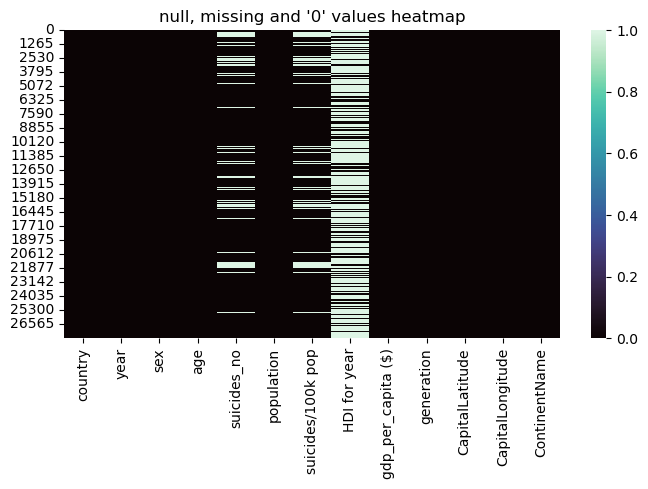


DUPLICATE VALUE COUNT:   0


In [3]:
plt.figure(figsize=(8,4))
plt.title('null, missing and \'0\' values heatmap')
sns.heatmap((df.isnull()) | (df == 0), cmap = 'mako')
plt.show()

print('\nDUPLICATE VALUE COUNT:  ', df.duplicated().sum())

`suicides_no`, `suicides/100k pop` and `HDI for year` have missing values and will be corrected in the following sections.  There are no duplicate values.`

###  1.2.2  Data Clean:  'suicides_no' and 'suicides/100k pop' <a id="prep_sui"></a>
Rows with no values ("null" or equal to "0") will be dropped.

In [4]:
#  percentage missing for 'suicides/100k pop' - before
for i in ['suicides_no', 'suicides/100k pop']:
    missing_before = len(df[df[i] == 0])*100/len(df)
    print(' before: {:>20} == 0:  {:>8.4f}%'.format(i,missing_before))
    
#  BEFORE - missing 'suicides_no' and 'suicides/100k pop'
sui_before = df[['suicides_no', 'suicides/100k pop']]

    
#  drop 'df['suicides/100k pop'] == 0' rows
len(df[df['suicides/100k pop'] == 0].index)
df.drop(df[df['suicides/100k pop'] == 0].index, inplace = True)

#  percentage missing for 'suicides/100k pop' - after
for i in ['suicides_no', 'suicides/100k pop']:
    missing_after = len(df[df[i] == 0])*100/len(df)
    print(' after:  {:>20} == 0:  {:>8.2f}%'.format(i,missing_after))

#  AFTER - missing 'suicides_no' and 'suicides/100k pop'
sui_after = df[['suicides_no', 'suicides/100k pop']]

 before:          suicides_no == 0:   15.3882%
 before:    suicides/100k pop == 0:   15.3882%
 after:           suicides_no == 0:      0.00%
 after:     suicides/100k pop == 0:      0.00%


<function matplotlib.pyplot.show(close=None, block=None)>

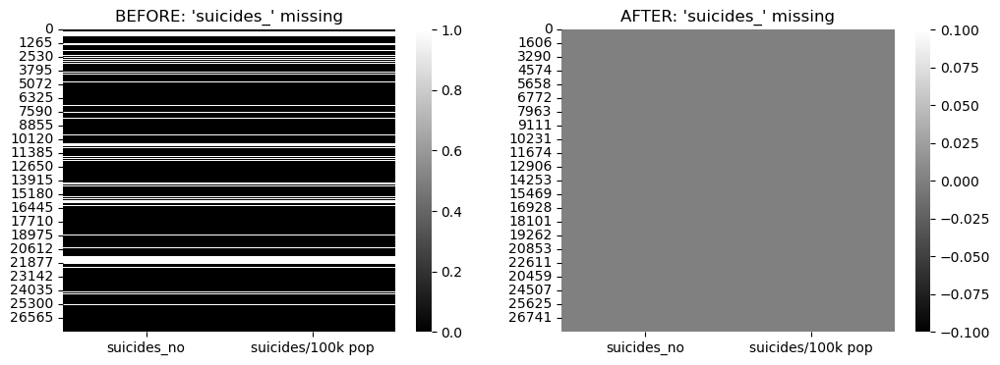

In [5]:
#  heatmaps for missing 'suicides_no' and 'suicides/100k pop'
plt.figure(figsize=(12,4))
plt.subplot(121)
sns.heatmap((sui_before.isnull()) | (sui_before == 0), cmap = 'binary_r')
plt.title('BEFORE: \'suicides_\' missing')
plt.subplot(122)
sns.heatmap((sui_after.isnull()) | (sui_after == 0), cmap = 'binary_r')
plt.title('AFTER: \'suicides_\' missing')
plt.show

Missing values for 'suicides_no' and 'suicides/100k pop' were in corresponding rows - two birds, one stone :-)

###  1.2.3  Data Clean:  'HDI for year' and '2016' data <a id="prep_hdi"></a>
**HDI for year:**  (forward fill)<br>
`HDI for year` data is significantly missing, however, we also know that the Human Development Index (HDI) is a slow moving index and replacing empty values with the last HDI value will not significantly impact the analysis.

Null values of `HDI for year` will be filled with the previous year's value.

**2016 data:**  (drop)<br>
Data profile shows that the number of observations for 2016 are significantly less (~140) than for other years (>700).  2016 data will be dropped.

**forward fill 'HDI for year':**

In [6]:
#  percentage missing for 'HDI for year'
print('HDI for year == NaN:  {:>8.4f}%\t(before)'.format( len(df[df['HDI for year'].isnull()])*100/len(df)))

#  before forward fill
hdi_before = df['HDI for year'].groupby(df['year']).sum()

#  fill ''HDI for year' nulls with previous values
df['HDI for year'].fillna(method='ffill', inplace=True)

#  drop remaining''HDI for year' nulls
df.drop(df[df['HDI for year'].isnull()].index, inplace = True)

#  after forward fill
hdi_after = df['HDI for year'].groupby(df['year']).sum()

#  percentage missing for 'HDI for year'
print('HDI for year == NaN:  {:>8.4f}%\t(after)'.format( len(df[df['HDI for year'].isnull()])*100/len(df)))

HDI for year == NaN:   69.3827%	(before)
HDI for year == NaN:    0.0000%	(after)


**Plot BEFORE and AFTER profiles for 'HDI for year' and '2016 data':**

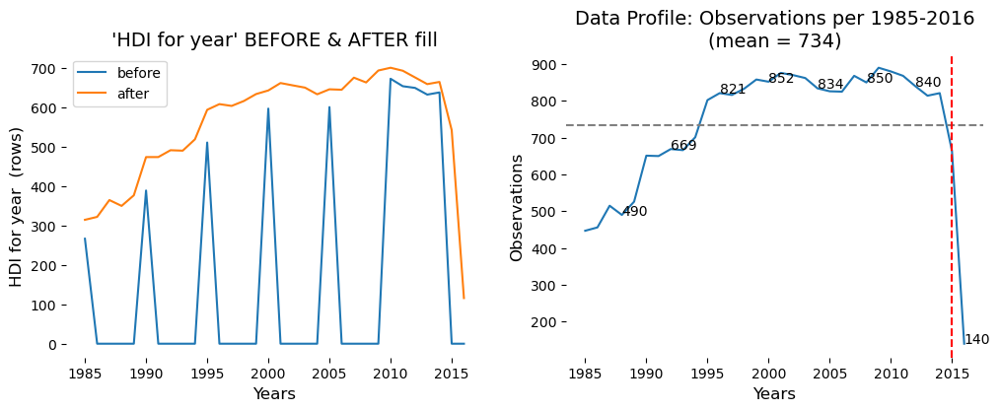

In [7]:
sr = df['year'].groupby(df['year']).value_counts()  # count rows per year
yr = df['year'].sort_values().unique()   #  years

#  plot HDI and 2016
plt.figure(figsize=(12,4))

plt.subplot(121)
plt.plot(yr,hdi_before)
plt.plot(yr,hdi_after)
plt.title('\'HDI for year\' BEFORE & AFTER fill', fontsize=14)
plt.xlabel('Years', fontsize=12)
plt.ylabel('HDI for year  (rows)', fontsize=12)
plt.legend(['before','after'])
plt.box(False)

#  plot data profile
plt.subplot(122)
plt.plot(yr,sr)
plt.title('Data Profile: Observations per 1985-2016\n(mean = {:.0f})'.format(sr.mean()), fontsize=14)
plt.xlabel('Years', fontsize=12)
plt.ylabel('Observations', fontsize=12)
plt.axhline(y = sr.mean(), color = 'gray', ls = '--')
plt.axvline(x = 2015, color = 'red', ls = '--')
plt.box(False)
for a,b in zip(yr, sr): 
    if a % 4 == 0:
        plt.text(a, b, str(b))
plt.show()

**Drop 2016 rows:**

In [8]:
#  drop year = 2016
print('before 2016 data drop:  ',df.shape)
df.drop(df[df['year'] == 2016].index, inplace = True)
print('after  2016 data drop:  ',df.shape)

before 2016 data drop:   (23481, 13)
after  2016 data drop:   (23341, 13)


##  1.3  Final Check <a id="prep_check"></a>
This is a final re-check for NULL and duplicate values in the dataset.

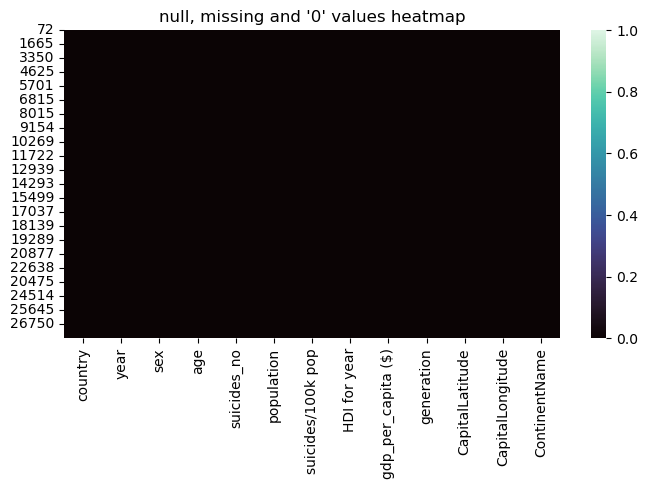


DUPLICATE COUNT:   0


In [9]:
plt.figure(figsize=(8,4))
plt.title('null, missing and \'0\' values heatmap')
sns.heatmap((df.isnull()) | (df == 0), cmap = 'mako')
plt.show()

print('\nDUPLICATE COUNT:  ', df.duplicated().sum())

**There are no nulls or duplicates in the dataset.**

   

##  1.4  Data Attributes   <a id="prep_attr"></a>

| COLUMN | type | description |
| :--- | :--- | :--- |
| **country** | categorical | country name |
| **year** | numerical | year of data |
| **sex** | categorical |sex of suicide victim |
| **age** | categorical |age range of suicide victim |
| **suicides_no** | numerical | number of suicides |
| **population** | numerical | population of country |
| **suicides/100k pop** | numerical | suicides per 100k of population |
| **HDI for year** | numerical | Human Development Index (HDI) for that year |
| **gdp_per_capita ($)** | numerical | Gross Domestic Product per person |
| **generation** | categorical | people born between certain years |
| **CapitalLatitude** | numerical | latitude (for maps) |
| **CapitalLongitude** | numerical | longitude (for maps) |
| **ContinentName** | categorical |continent |

<br>   
**Dataset contains information on suicides from 1985-2015 and is now ready for analysis.**

##  1.5  Data Overview   <a id="prep_over"></a>
The **Suicide Rates Overview 1985 to 2016** dataset contains data for half the countries on Earth and does have data on some of the most populous countries are not included in the dataset.

source:  https://www.worldometers.info/geography/how-many-countries-are-there-in-the-world/

Out of the top 10 most populous countries:
['China', 'India', 'United States', 'Indonesia', 'Brazil', 'Pakistan', 'Nigeria', 'Bangladesh', 'Russia', 'Mexico']

Only the following 4 are present:
['Brazil', 'Mexico', 'Russia', 'United States']


Dataset has 98 countries on 7 continents spanning 31 years.


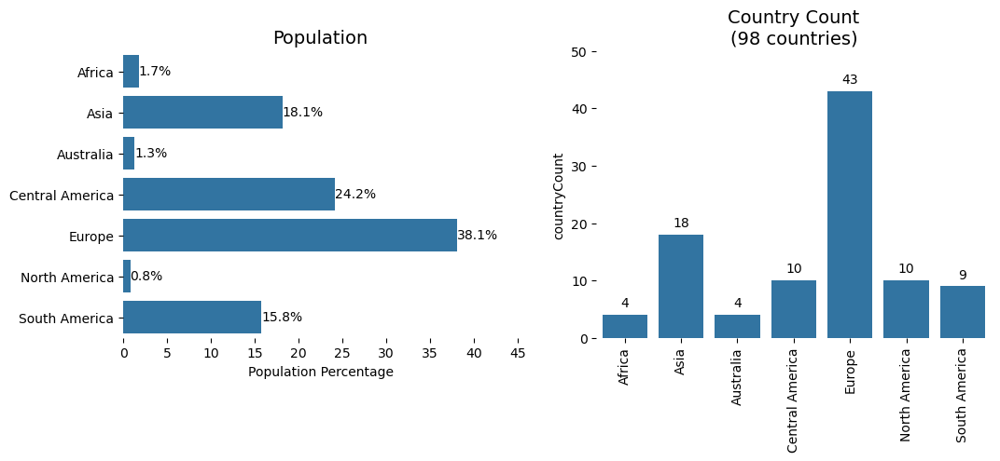

In [10]:
#  Top 10 most populous countries in the world
top10 = ['China','India','United States','Indonesia','Brazil','Pakistan','Nigeria','Bangladesh','Russia','Mexico']
in_set = df.country[df.country.str.contains('|'.join(top10))].unique().tolist()

print('Out of the top 10 most populous countries:\n{}\n\nOnly the following {} are present:\n{}'.format(top10,len(in_set),in_set))

#  dataset
print('\n\nDataset has', len(df['country'].unique()),'countries on' ,len(df['ContinentName'].unique()),'continents spanning' ,len(df['year'].unique()),'years.')



#  SET UP CONTINENT DATAFRAME
#  population, population percent and country count per continent
df_cont = df.groupby('ContinentName')['population'].sum().reset_index()
df_cont['Population Percentage'] = df_cont['population']*100/df_cont['population'].sum()

#  countries count per continent
cntCont = df['country'].groupby(df['ContinentName']).nunique()

#  add countryCount column to df_cont
df_cont['countryCount'] = cntCont[df_cont['ContinentName']].values 


#  PLOTs - Population AND Country Count per Continent 
plt.figure(figsize=(12,4))
plt.subplot(121)
ax = sns.barplot(data = df_cont, x = 'Population Percentage', y='ContinentName')
plt.title('Population', fontsize=14)
plt.xlim([0,45])
plt.ylabel("")
plt.box(False)
for p in ax.patches:
    ax.annotate("{:,.1f}%".format(p.get_width()), (p.get_x() + p.get_width(), p.get_y()+.4), ha='left', va='center')

plt.subplot(122)
ax = sns.barplot(data = df_cont, x = 'ContinentName', y='countryCount')
plt.title('Country Count\n({} countries)'.format(df_cont.countryCount.sum()), fontsize=14)
plt.xlabel('')
plt.xticks(rotation = 90)
plt.ylim([0,50])
plt.box(False)
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width()/2, p.get_height()+2), ha='center', va='center')
    
plt.show()

**DATA OVERVIEW:**
-  6 of the most populous countries are missing
-  **China** and **India** account for almost 30% of the global population and are missing 
-  most of **African** countries are missing 
-  **Europe** has 43 out of 98 countries in the data and accounts for 38% of the population
-  It is safe to assume that analysis will be skewed towards European countries

---
**Set up ordered list for plotting:**
<br>
Sort values for:
- Continent Names
- Continent Names + 'Global'
- Age Groups

In [11]:
#  create an ordered list for plotting:
cont_list = df.ContinentName.sort_values().unique()
cont_glob = np.insert(cont_list, 0, 'Global')  # add Global as 1st
age_list = ['5-14 years', '15-24 years', '25-34 years', '35-54 years',  '55-74 years', '75+ years']

---
<a id="eda"></a>
#  2.  Data Visualization (EDA) 
Various plots are untilized to visualize the data.

## 2.1  Suicide Rates per Country <a id="eda_country"></a>
Plot the average suicide rates per country and compare with the global mean.

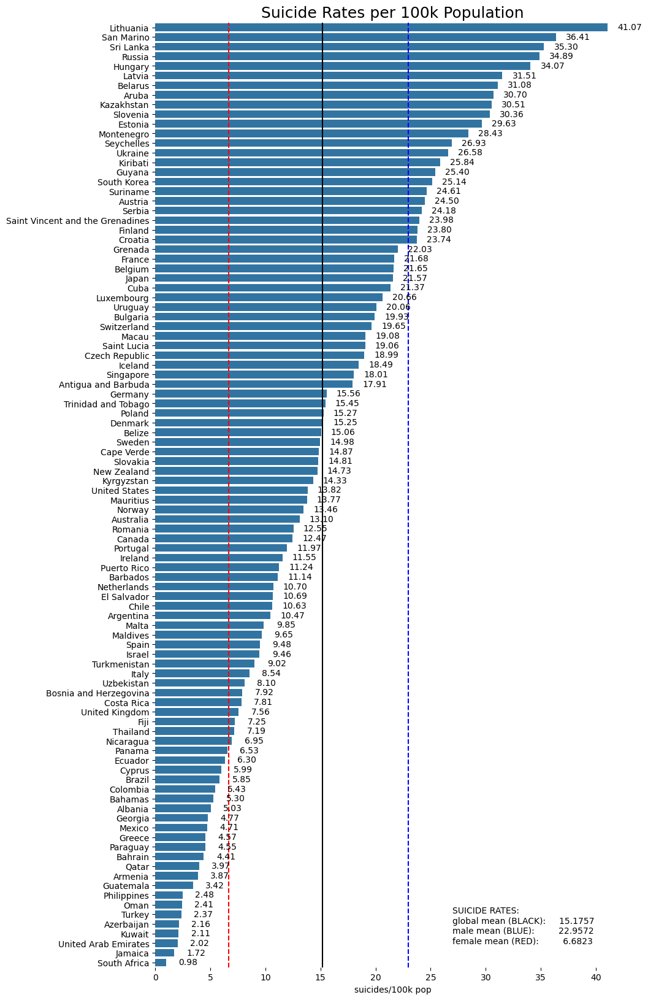

In [12]:
#  suicide rate average: overall, male, female
suicide_mean = df['suicides/100k pop'].mean()
sr_m = df['suicides/100k pop'][df['sex'] == 'male'].mean()
sr_f = df['suicides/100k pop'][df['sex'] == 'female'].mean()

#  dataframe with suicide averages for each country
df_suicideRate = df['suicides/100k pop'].groupby(df['country']).mean().sort_values(ascending=False).reset_index()


#  plot suicide rates per country
plt.figure(figsize=(10,20))
ax = sns.barplot(data = df_suicideRate, x = 'suicides/100k pop', y='country')
plt.title('Suicide Rates per 100k Population', fontsize=18)

plt.axvline(x= suicide_mean, color = 'black')#, ls = '--')
plt.axvline(x= sr_m, color = 'blue', ls = '--')
plt.axvline(x= sr_f, color = 'red', ls = '--')
plt.text(27,95,'SUICIDE RATES:\nglobal mean (BLACK):  {:>10.4f}\nmale mean (BLUE): {:>15.4f}\nfemale mean (RED): {:>14.4f}'.format(suicide_mean, sr_m, sr_f))

plt.ylabel("")
plt.box(False)

for p in ax.patches:
    ax.annotate("%.2f" % p.get_width(), (p.get_x() + p.get_width() +2, p.get_y()+.4), ha='center', va='center')

plt.show()

- Global **suicides rates** is 15.17 per 100k of the population
- males are **3.5 more likely** to commit suicide than females (22.96 vs 6.68)
- **European countries**, such as Latvia, Hungary and Belarus, have significantly higher suicide rates

## 2.2  Suicide Rates per Continents<a id="eda_cont"></a>
Plot the **population** and the **average suicide rates** for each continent.

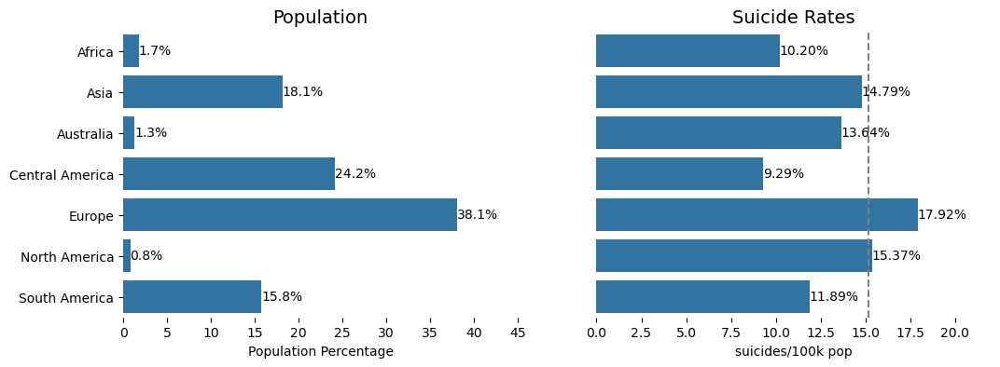

In [13]:
#  mean suicides/100k pop per continent
df_cont['suicides/100k pop'] = df.groupby('ContinentName')['suicides/100k pop'].mean().values

plt.figure(figsize=(12,4))

#  population - barchart
plt.subplot(121)
ax = sns.barplot(data = df_cont, x = 'Population Percentage', y='ContinentName')
plt.title('Population', fontsize=14)
plt.xlim([0,45])
plt.ylabel("")
plt.box(False)
for p in ax.patches:
    ax.annotate("{:,.1f}%".format(p.get_width()), (p.get_x() + p.get_width(), p.get_y()+.4), ha='left', va='center')

#  suicides/100k pop - barchart
plt.subplot(122)
ax = sns.barplot(data = df_cont, x = 'suicides/100k pop', y='ContinentName')
plt.title('Suicide Rates', fontsize=14)
plt.xlim([0,22])
plt.ylabel("")
plt.yticks([])   # no y-axis ticks
plt.box(False)
plt.axvline(x= suicide_mean, color = 'gray', ls = '--')
for p in ax.patches:
    ax.annotate("{:,.2f}%".format(p.get_width()), (p.get_x() + p.get_width(), p.get_y()+.4), ha='left', va='center')    
plt.show()

-  **Europe** has the most countries in the data and is skewing the global suicide average.

## 2.3  Suicide Trends and Population<a id="eda_pop"></a>
- Plot **population** and **mean suicide rates** for male and female per continent, 
- and plot the **population** and **suicide rates** for male and female **over time**.

###  Mean Suicide Rates and Ratios per Continent

\begin{align*} 
\mathsf{\text{Suicide Rate Ratio} = \frac{Male Suicide Rates}{Female Suicide Rates}}
\end{align*}

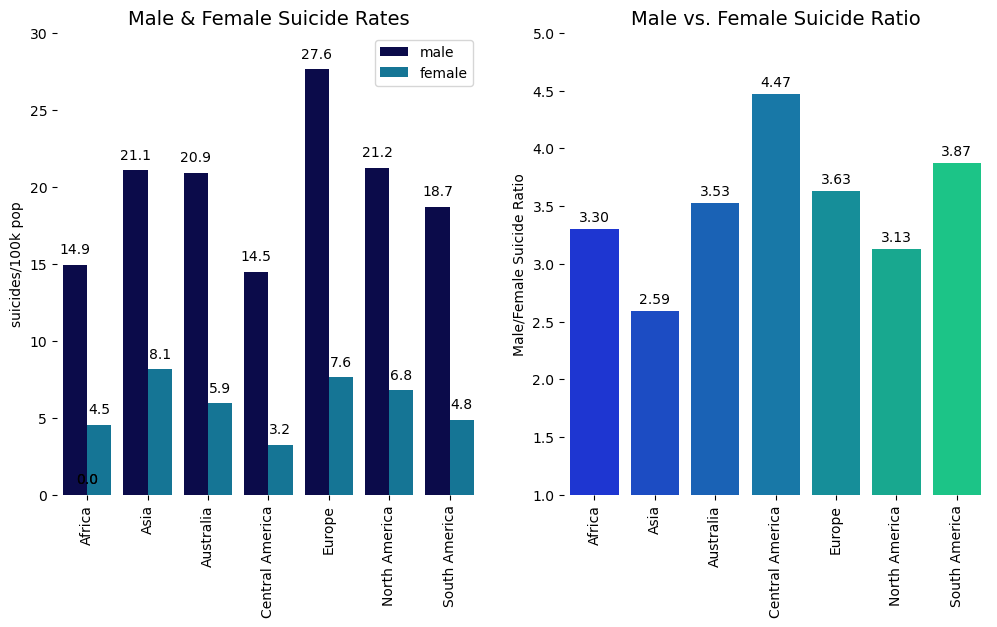

In [14]:
#  add male and female suicide means
for i, row in df_cont.iterrows():
    c = df_cont.loc[i]['ContinentName']
    df_cont.loc[i, 'male'] = df['suicides/100k pop'][(df['ContinentName'] == c) & (df['sex'] == 'male')].mean()
    df_cont.loc[i, 'female'] = df['suicides/100k pop'][(df['ContinentName'] == c) & (df['sex'] == 'female')].mean()

#  add male and female ratio of suicide means
df_cont['ratio'] = df_cont['male']/df_cont['female']


#  PLOTs - suicide rates per continent AND male/female ratio
plt.figure(figsize=(12,6))
plt.subplot(121)
ax = sns.barplot(data = df, x = 'ContinentName', order = cont_list, y = 'suicides/100k pop', hue = 'sex', ci=None, palette = 'ocean')
plt.title('Male & Female Suicide Rates', fontsize=14)
plt.xlabel("")
plt.xticks(rotation = 90)
plt.ylim([0,30])
plt.legend(title = "")
plt.box(False)
for p in ax.patches:
    ax.annotate("%.1f" % p.get_height(), (p.get_x() + p.get_width()/2, p.get_height()+1), ha='center', va='center')

plt.subplot(122)
#ax = sns.barplot(df_cont['ContinentName'], df_cont['ratio'], palette = 'winter')
ax = sns.barplot(x=df_cont['ContinentName'], y=df_cont['ratio'], palette='winter')

plt.title('Male vs. Female Suicide Ratio', fontsize=14)
plt.xlabel("")
plt.xticks(rotation = 90)
plt.ylabel('Male/Female Suicide Ratio')
plt.ylim([1,5])
plt.box(False)
for p in ax.patches:
    ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width()/2, p.get_height()+.1), ha='center', va='center')

plt.show()

-  **Central American** countries have a dispropotionaly higher percentages of male commiting suicide than female.  Overall, males are more likely to commit suicide than women
-  **Asian** countries have a significantly higher incidence of females commiting suicides than other countries

###  Mean Suicide Rates per Continent Over Time
Following figures cover the Global and Continent suicide rates over time.

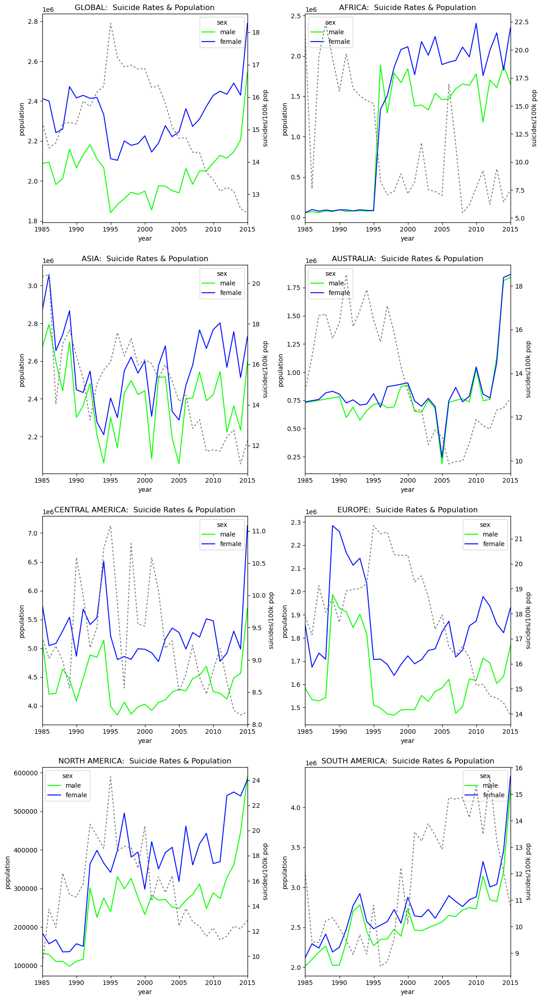

In [15]:
#  plot Suicide Rates & Population (male & female) over Time
plt.figure(figsize=(12,22))
a = 4   # subplot rows
b = 2   # subplot columns
c = 1   # subplot counter

for i in cont_glob:
    
    if i == 'Global':
        dfx = df   # GLOBAL PLOT
    else:
        dfx = df[df['ContinentName'] == i]

    #  subplots        
    plt.subplot(a,b,c)
    tw1 = sns.lineplot(data = dfx, x='year', y='population', ci = None, hue = 'sex', palette = 'hsv')
    tw2 = tw1.twinx()
    tw2 = sns.lineplot(data = dfx, x='year', y='suicides/100k pop', color ='grey', ci = None, style = True, dashes = [(2,2)])
    tw2 = plt.legend('',frameon=False)
    tw2 = plt.xlim([1985,2015])
    plt.title('{}:  Suicide Rates & Population'.format(i.upper()))
    c = c + 1

plt.tight_layout()
plt.show()

- **Globally**, the overall suicide trend has been sharply declining since 1995, even though the population has been increasing significantly in recent years
- **Africa** saw a sharp increase in suicides in 2005-2006.  Suicide rates have been erratic in recent years.
- **Asia** is seeing an uptick in suicides in recent years
- **Australia**, **North America** and **South America** are seeing an uptick in suicides, however, rates are still much lower relative to the population growth
-  **Central America** and **Europe** are both seeing an increase in population and a decrease in suicide rates

## 2.4  Suicide Trends and Age Group<a id="eda_age"></a>
Plot the suicide trends from 1985-2015 for the various age groups.

In [16]:
print('\nGLOBAL SUICIDE RATES PER AGE GROUP\n')
print(f"{'Age Group' : <10}{'MALE': >12}{'FEMALE': >8}")
print('-'*30)
for i in age_list:
    a = df['suicides/100k pop'][(df['age'] == i) & (df['sex'] == 'male')].mean()
    b = df['suicides/100k pop'][(df['age'] == i) & (df['sex'] == 'female')].mean()
    print('{:<14}\t{:>6.2f}\t{:>6.2f}'.format(i,a,b))


GLOBAL SUICIDE RATES PER AGE GROUP

Age Group         MALE  FEMALE
------------------------------
5-14 years    	  1.07	  0.73
15-24 years   	 14.72	  5.07
25-34 years   	 21.29	  5.26
35-54 years   	 25.14	  6.72
55-74 years   	 27.67	  8.45
75+ years     	 45.18	 13.10


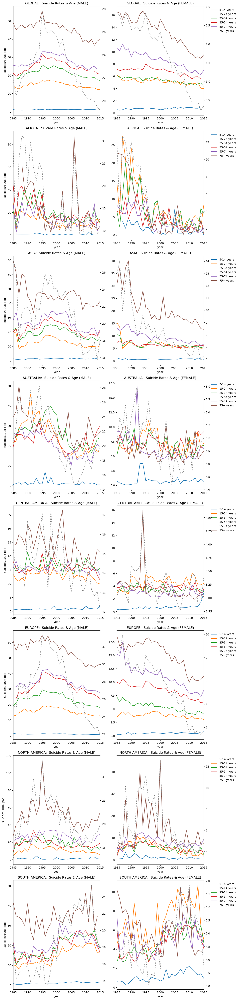

In [17]:
#  plot Suicide Rates & Age Group over Time
plt.figure(figsize=(12,50))
a = 8   # subplot rows
b = 2   # subplot columns
c = 1   # subplot counter

for i in cont_glob:
    
    if i == 'Global':
        dfx = df   # GLOBAL PLOT
    else:
        dfx = df[df['ContinentName'] == i]

    #  subplot 1 - male  
    plt.subplot(a,b,c)  # male
    tw1 = sns.lineplot(data = dfx[dfx['sex'] == 'male'], x='year',    y='suicides/100k pop', hue='age', hue_order = age_list, ci = None)
    plt.title('{}:  Suicide Rates & Age (MALE)'.format(i.upper()))
    plt.legend('',frameon=False)
    plt.xlim([1985,2015])
    
    tw2 = tw1.twinx()
    tw2 = sns.lineplot(data = dfx[dfx['sex'] == 'male'], x='year',  y='suicides/100k pop', color ='grey', ci = None, style = True, dashes = [(2,2)])
    plt.legend('',frameon=False)
    plt.xlim([1985,2015])
    plt.ylabel("")
    c = c + 1
    
    #  subplot 2 - female
    plt.subplot(a,b,c)  # female
    tw1 = sns.lineplot(data = dfx[dfx['sex'] == 'female'], x='year',  y='suicides/100k pop', hue='age', hue_order = age_list, ci = None)
    plt.legend(bbox_to_anchor =(1.4, 1), loc='upper right', frameon=False)
    plt.xlim([1985,2015])
    plt.ylabel("")
    
    tw2 = tw1.twinx()
    tw2 = sns.lineplot(data = dfx[dfx['sex'] == 'female'], x='year',    y='suicides/100k pop', color ='grey', ci = None, style = True, dashes = [(2,2)])
    plt.title('{}:  Suicide Rates & Age (FEMALE)'.format(i.upper()))
    plt.legend('',frameon=False)
    plt.xlim([1985,2015])
    plt.ylabel("")
    c = c + 1

plt.tight_layout()
plt.show()

**GLOBAL:** Rate of suicides have been declining for both males and females, however, there has been a significant uptick in rates of females in age groups 55+ in recent years.

- after a spike in **1995**, suicides rates globally have been on a steady decline for all age groups
- there is some indication of an **uptick in suicides** from 2013 in older people
- females in the **5-14 years** age group have a very shallow uptick in suicides for the past few decades
- people within the **50-year span** of 25-75 yrs have a steady incidence of suicides
- People that are **75+ years** have a significantly higher incidence of suicides, for both males and females
<br><br>
- **Africa** saw a significant increase in male suicide in 2005-2006, however there has been a steady decline in suicides for both sexes
- **Asia** has had a steady decline in suicides, however, the trend for males over 75 yrs in increasing
- **Australia** is seeing a significant increase in suicides in people 35-54 yrs old.  Females in age groups 5-14 yr and 55-74 yr were committing suicides at alarming rates in the mid-1990s.  There is an uptrend in suicides in recent years.
- **Central America** overall trend is declining, however there is a significant increase in female 5-14 yr committing suicides in recent years
- **Europe** is seeing an overall decline in suicides, but trend for females 55 and older is increasing
- **North America** is seeing an uptick in males 35 yr and older committing suicides.  The general trend is increasing in recent years
- **South America** has a rapidly declining suicide rate.  However, the trends are very volatile

## 2.5  Suicide Trends and Human Development Index (HDI)<a id="eda_hdi"></a>
Plot Human Development Index (HDI) for all continents over time.

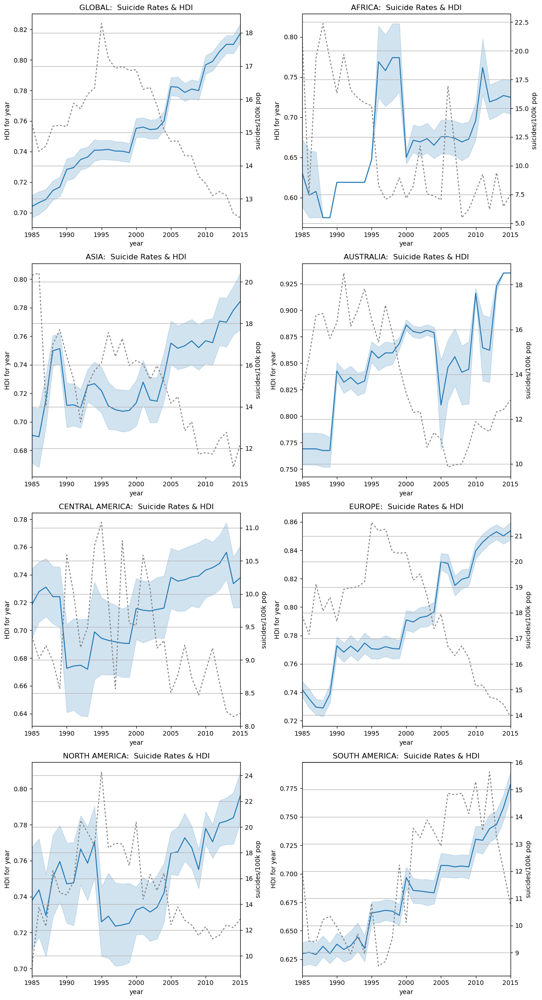

In [18]:
#  plot Suicide Rates & HDI over Time
plt.figure(figsize=(12,22))
a = 4   # subplot rows
b = 2   # subplot columns
c = 1   # subplot counter

for i in cont_glob:
    
    if i == 'Global':
        dfx = df   # GLOBAL PLOT
    else:
        dfx = df[df['ContinentName'] == i]

    #  subplots        
    plt.subplot(a,b,c)
    tw1 = sns.lineplot(data = dfx, x='year', y='HDI for year')
    
    tw2 = tw1.twinx()
    tw2 = sns.lineplot(data = dfx, x='year', y='suicides/100k pop', color ='grey', ci = None, style = True, dashes = [(2,2)])
    tw2 = plt.legend('',frameon=False)
    tw2 = plt.xlim([1985,2015])
    plt.title('{}:  Suicide Rates & HDI'.format(i.upper()))
    plt.grid()
    c = c + 1

plt.tight_layout()
plt.show()

- **Human Development Index (HDI):**  Overall HDI has increased and the suicide rate has steadily going down.  There is an inverse relationship between HDI and suicides, however, there is also a lag when HDI goes up and suicides goes down

## 2.6  Suicide Trends and Gross Domestic Product per Capita (GDPc)<a id="eda_gdp"></a>
Plot Gross Domestic Product per Capita (GDPc) for all continents over time.

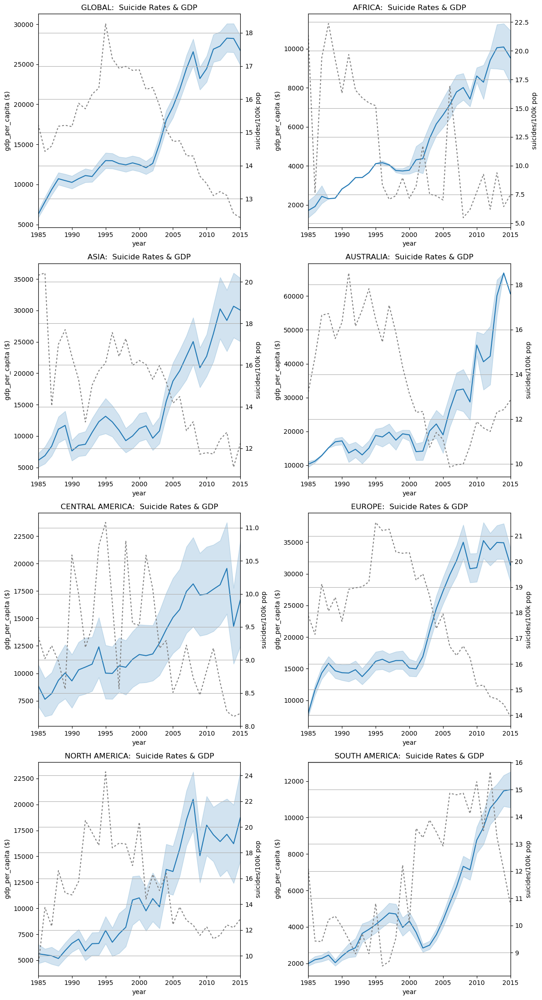

In [19]:
#  plot Suicide Rates & GDP over Time
plt.figure(figsize=(12,22))
a = 4   # subplot rows
b = 2   # subplot columns
c = 1   # subplot counter

for i in cont_glob:
    
    if i == 'Global':
        dfx = df   # GLOBAL PLOT
    else:
        dfx = df[df['ContinentName'] == i]

    #  subplots        
    plt.subplot(a,b,c)
    tw1 = sns.lineplot(data = dfx, x='year', y='gdp_per_capita ($)')
    
    tw2 = tw1.twinx()
    tw2 = sns.lineplot(data = dfx, x='year', y='suicides/100k pop', color ='grey', ci = None, style = True, dashes = [(2,2)])
    tw2 = plt.legend('',frameon=False)
    tw2 = plt.xlim([1985,2015])
    plt.title('{}:  Suicide Rates & GDP'.format(i.upper()))
    plt.grid()
    c = c + 1

plt.tight_layout()
plt.show()

- **Gross Domestic Product per Capita (GDPc):**  Overall GDP has increased and the suicide rate has steadily going down.  There is an inverse relationship between GDP and suicides

---
# 3.  Correlations<a id="corr"></a>
Correlation is a statistical metric for measuring to what extent different variables are interdependent.  In the analysis, we will look at the overall correlation, as well as the correlations based on male/female.

In order to perform correlation, we need to first take care of two very important processes:

  *  Encoding categorical attributes with numerical values
  *  Normalization of the data

## 3.1  Encoding and Normalization<a id="corr_encode"></a>
### Encoding
Machine learning algorithms cannot process categorical or text data unless they have been converted to numbers. Encoding maps categorical values to integer values, which are represented as a binary vector that are all zero values, except the index of the integer, which is set to 1.

Categorical attributes will be manually encoded with numeric values.  The steps involved are:

1.  rearrange column names
2.  encode with numerical values

In [20]:
# 1.  rearrange column name so "suicides/100k pop" is first
df_corr = df[['suicides/100k pop', 'sex', 'age', 'population', 'HDI for year', 'gdp_per_capita ($)', 'generation', 'ContinentName']]

# 2.  encode with numerical values
df_corr['sex'] = df_corr['sex'].map({'female':0,'male':1})
df_corr['age'] = df_corr['age'].map({
        '5-14 years':0,'15-24 years':1,'25-34 years':2,
        '35-54 years':3,'55-74 years':4,'75+ years':5})
df_corr['generation'] = df_corr['generation'].map({
        'Generation Z':0,'Millenials':1,'Generation X':2,
        'Boomers':3,'Silent':4,'G.I. Generation':5})
df_corr['ContinentName'] = df_corr['ContinentName'].map({
        'Africa':0,'Asia':1,'Australia':2,'Central America':3,
        'Europe':4,'North America':5,'South America':6})

df_corr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23341 entries, 72 to 27819
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   suicides/100k pop   23341 non-null  float64
 1   sex                 23341 non-null  int64  
 2   age                 23341 non-null  int64  
 3   population          23341 non-null  int64  
 4   HDI for year        23341 non-null  float64
 5   gdp_per_capita ($)  23341 non-null  int64  
 6   generation          23341 non-null  int64  
 7   ContinentName       23341 non-null  int64  
dtypes: float64(2), int64(6)
memory usage: 1.6 MB


###  Normalization
Normalization is a rescaling of the data from the original range so that all values are within a certain range, typically between 0 and 1. Normalized data is essential in machine learning. Correlation and models will not produce good results if the scales are not standardized.

Data in **df_corr** will be normalized and the **df** data frame will be updated with the encoded and normalized data.

In [21]:
from sklearn.preprocessing import MinMaxScaler

df_norm = MinMaxScaler().fit_transform(df_corr)
df_corr = pd.DataFrame(df_norm, index = df_corr.index, columns = df_corr.columns)

## 3.2  Overall Correlation<a id="corr_over"></a>

<Axes: title={'center': 'Suicide Correlation'}>

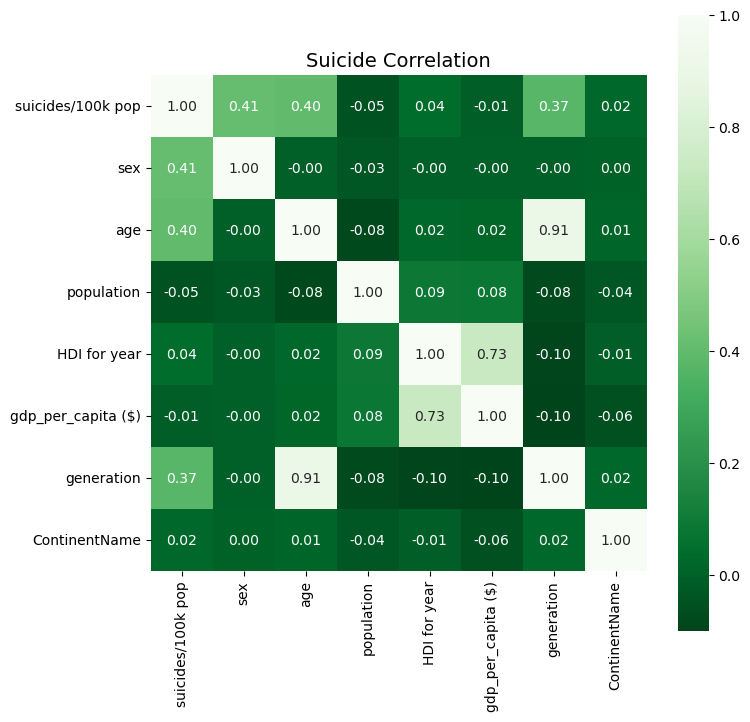

In [22]:
#  Correlations - OVERALL
dataCorr = df_corr.corr()

#  print correlation
dataCorr['suicides/100k pop'].sort_values(ascending=False)

#  plot heatmap
plt.figure(figsize=(8,8))
plt.title('Suicide Correlation', fontsize=14)
sns.heatmap(dataCorr, annot=True, fmt='.2f', square=True, cmap = 'Greens_r')

## 3.3  Correlation - Male & Female<a id="corr_sex"></a>

In [23]:
#  Correlation MALE - filter dataframe for male/female
df_male   = df_corr[(df_corr['sex'] == 1)]              # male
df_maleCorr = df_male.drop(["sex"], axis=1).corr()      # male corr

#  Correlation FEMALE - filter dataframe for male/female
df_female = df_corr[(df_corr['sex'] == 0)]              # female
df_femaleCorr = df_female.drop(["sex"], axis=1).corr()  # female corr

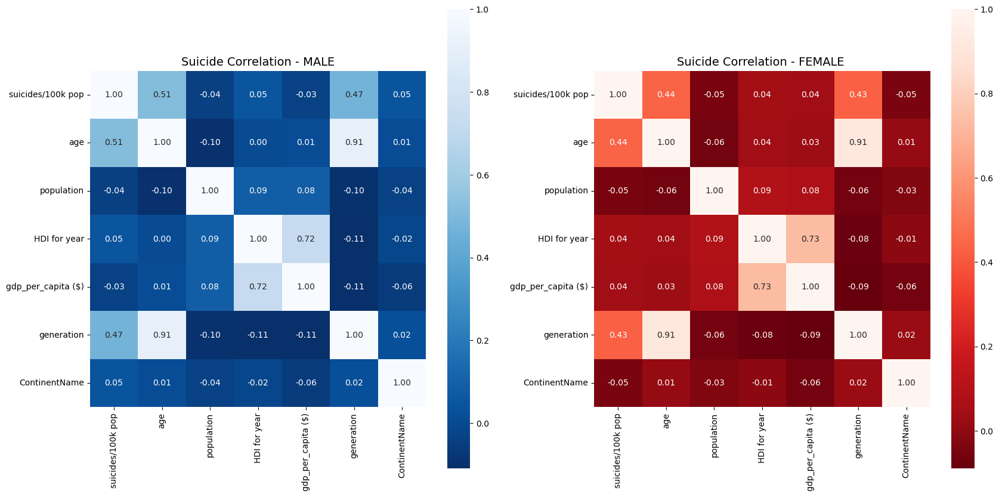

In [24]:
#  Correlation heatmaps for FEMALE/MALE
fig = plt.figure(figsize=(20,10))
fig.add_subplot(121)
plt.title('Suicide Correlation - MALE', fontsize=14)
sns.heatmap(df_maleCorr, annot=True, fmt='.2f', square=True, cmap = 'Blues_r')
fig.add_subplot(122)
plt.title('Suicide Correlation - FEMALE ', fontsize=14)
sns.heatmap(df_femaleCorr, annot=True, fmt='.2f', square=True, cmap = 'Reds_r')
plt.show()

In [25]:
#  Correlation - sorted for both male/female
corrM = df_maleCorr['suicides/100k pop'].sort_values(ascending=False)
corrF = df_femaleCorr['suicides/100k pop'].sort_values(ascending=False)

corrALL = pd.DataFrame(columns = ['MALE','correlation-m','FEMALE','correlation-f'])
corrALL['MALE']   = corrM.index
corrALL['correlation-m'] = corrM.values
corrALL['FEMALE'] = corrF.index
corrALL['correlation-f'] = corrF.values
print(corrALL)

                 MALE  correlation-m              FEMALE  correlation-f
0   suicides/100k pop       1.000000   suicides/100k pop       1.000000
1                 age       0.510859                 age       0.437295
2          generation       0.468135          generation       0.425663
3        HDI for year       0.049928        HDI for year       0.044708
4       ContinentName       0.045291  gdp_per_capita ($)       0.040364
5  gdp_per_capita ($)      -0.032025       ContinentName      -0.045885
6          population      -0.044342          population      -0.047480


- As noted above, **Age**, **generation** and **sex** are significant factors in determining suicide rates for both males and females.

---
# 4.  World Maps<a id="maps"></a>
Maps are a great way to visually represent geographical data.  Following three world maps are presented:

-  Folium World Map
-  Choropleth World Map
-  Choropleth World Map - Animated

## 4.1  Folium World Map<a id="maps_folium"></a>

Folium map showing the **number of suicides** per countries in the dataset.

In [26]:
#  create dataframe for mapping
mapdf = pd.DataFrame(columns =  ['country','suicides_no','lat','lon'])

mapdf.lat = mapdf.lat.astype(float).fillna(0.0)
mapdf.lon = mapdf.lat.astype(float).fillna(0.0)

mapdf['country']     = df['suicides_no'].groupby(df['country']).sum().index
mapdf['suicides_no'] = df['suicides_no'].groupby(df['country']).sum().values
for i in range(len(mapdf.country)):
    mapdf.lat[i] =  df.CapitalLatitude[(df['country'] == mapdf.country[i])].unique()
    mapdf.lon[i] = df.CapitalLongitude[(df['country'] == mapdf.country[i])].unique()


#  make map - popup displays country and suicide count
#  lat/lon must be "float"
world_map = folium.Map(location=[mapdf.lat.mean(),mapdf.lon.mean()],zoom_start=2)
marker_cluster = MarkerCluster().add_to(world_map)

for i in range(len(mapdf)-1):
    label = '{}:\t{} suicides'.format(mapdf.country[i].upper(),mapdf.suicides_no[i])
    label = folium.Popup(label, parse_html=True)
    folium.Marker(location=[mapdf.lat[i],mapdf.lon[i]],
            popup = label,
            icon = folium.Icon(color='green')
    ).add_to(marker_cluster)


world_map.add_child(marker_cluster)
world_map         #  display map

## 4.2  Choropleth World Map<a id="maps_chor"></a>
Choropleth map showing the **suicide rates** of the countries in the dataset.

In [27]:
# create dataframe with Country and mean of Suicide rates per 100k Population
df_choro = df[['suicides/100k pop', 'country']].groupby(['country']).mean().sort_values(by='suicides/100k pop').reset_index()

# Update US name to match JSON file
df_choro.replace({'United States': 'United States of America'}, inplace=True)

# Load GeoJSON file
world_geo = 'world-countries.json'


# Create a map object
world_choropleth = folium.Map(location=[0, 0], tiles='Cartodb Positron', zoom_start=1)

# Add the Choropleth layer properly
folium.Choropleth(
    geo_data=world_geo,
    data=df_choro,
    columns=['country', 'suicides/100k pop'],
    key_on='feature.properties.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    line_opacity=0.2,
    legend_name='Suicide Rates per 100K Population'
).add_to(world_choropleth)

# Display map
world_choropleth

In [28]:
import os
print(os.listdir("./"))


['.ipynb_checkpoints', 'concap.csv', 'corporate_stress_dataset.csv', 'file.csv', 'input.ipynb', 'master.csv', 'project.ipynb', 'Suicides_in_India.csv', 'Untitled Folder', 'world-countries.json']


# 4.3 Choropleth World Map - Animated
Animated choropleth map showing the suicide rates of the countries over time.

In [29]:
world_choropelth_animated = px.choropleth(df.sort_values(by='year'),
    locations ="country", 
    locationmode = 'country names',
    color ="suicides/100k pop", 
    hover_name ="country",  
    color_continuous_scale = 'PuBu', #px.colors.sequential.Reds, 
    color_continuous_midpoint = 13,
    scope ="world", 
    animation_frame ="year") 
world_choropelth_animated.show()